<a href="https://colab.research.google.com/github/jcdumlao14/PredictingWineQuality-PyCaret/blob/main/wine.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# "Predicting Wine Quality: A Machine Learning Approach"

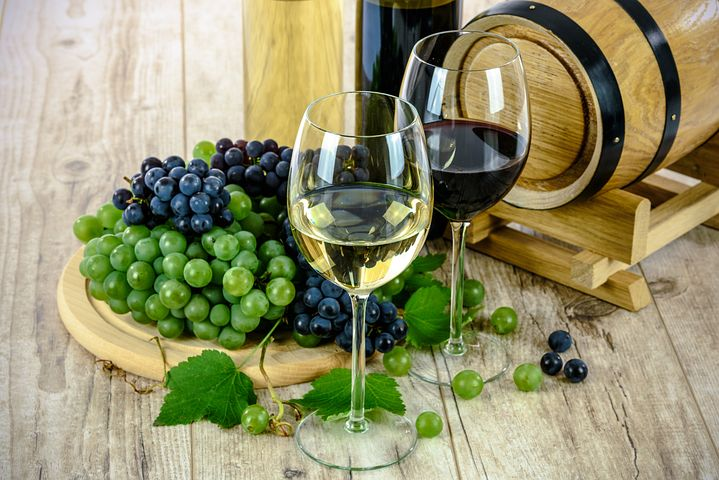

# **Introduction**

Are you a wine enthusiast with a passion for data analysis? If so, you're in for a treat with the Wine Quality dataset. Created in 2009, this publicly available dataset contains information on the physicochemical properties of red and white wines, as well as their sensory data as rated by experts. With 11 input variables and an output attribute of wine quality rated on a scale of 0 to 10, this dataset can be viewed as a classification or regression task. In fact, several data mining methods were applied to this dataset, with the support vector machine model achieving the best results. As a wine lover, you'll be fascinated by the correlations between fixed and volatile acidity, residual sugar, and alcohol percentage, to name a few. The Wine Quality dataset has 6,497 instances, and because the classes are ordered and not balanced, outlier detection algorithms can be used to detect the few excellent or poor wines. So, grab a bottle of Vinho Verde and let's explore the Wine Quality dataset!

# **Goal**

The goal is to use this dataset for research purposes, particularly in the fields of data mining, regression analysis, and feature selection. 

In [4]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file


In [5]:
%%capture
!pip install pycaret  

# **1. Data Setup**

In [6]:
wine_df = pd.read_csv('/content/wineQualityReds.csv')

In [7]:
wine_df

,Unnamed: 0,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality
0,1,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,2,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,3,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,4,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,5,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,1595,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,1596,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,1597,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,1598,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [ ]:
wine_df.shape

(1599, 13)

In [ ]:
wine_df.describe()

,Unnamed: 0,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,800.000000,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,461.735855,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,1.000000,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,400.500000,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,800.000000,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,1199.500000,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,1599.000000,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [ ]:
wine_df['quality'].unique()

array([5, 6, 7, 4, 8, 3])

In [2]:
from pycaret import classification
from setuptools import setup

In [8]:
from pycaret.classification import *

In [ ]:
#%%capture
#!pip install -e .

In [ ]:
#from distutils.core import setup
#import py2exe

# **2. Set up the Environment**

This step involves importing PyCaret and the necessary dataset, and initializing the environment using the setup() function. This function handles data preprocessing, feature engineering, and other important steps that prepare the data for modeling.

In [1]:
import sys
sys.argv = [arg for arg in sys.argv if not arg.startswith("-f")]


In [ ]:
from sklearn import preprocessing
import numpy as np

In [9]:
wine_setup = setup(data = wine_df, target = 'quality', session_id=123)

,Description,Value
0,session_id,123
1,Target,quality
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(1599, 13)"
5,Missing Values,False
6,Numeric Features,12
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=['Unnamed: 0'],
                                      ml_usecase='classification',
                                      numerical_features=[], target='quality',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                n...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('clust

In [10]:
wine_setup

(False,
 {'parameter': 'Hyperparameters',
  'auc': 'AUC',
  'confusion_matrix': 'Confusion Matrix',
  'threshold': 'Threshold',
  'pr': 'Precision Recall',
  'error': 'Prediction Error',
  'class_report': 'Class Report',
  'rfe': 'Feature Selection',
  'learning': 'Learning Curve',
  'manifold': 'Manifold Learning',
  'calibration': 'Calibration Curve',
  'vc': 'Validation Curve',
  'dimension': 'Dimensions',
  'feature': 'Feature Importance',
  'feature_all': 'Feature Importance (All)',
  'boundary': 'Decision Boundary',
  'lift': 'Lift Chart',
  'gain': 'Gain Chart',
  'tree': 'Decision Tree',
  'ks': 'KS Statistic Plot'},
       fixed.acidity  volatile.acidity  citric.acid  residual.sugar  chlorides  \
 0               7.4             0.700         0.00             1.9      0.076   
 1               7.8             0.880         0.00             2.6      0.098   
 2               7.8             0.760         0.04             2.3      0.092   
 3              11.2             0.280 

In [ ]:
%%capture
!pip install autoviz


In [ ]:
eda()

INFO:logs:Initializing get_config()
INFO:logs:get_config(variable=data_before_preprocess)
INFO:logs:Global variable: data_before_preprocess returned as       Unnamed: 0  fixed.acidity  volatile.acidity  citric.acid  \
0              1            7.4             0.700         0.00   
1              2            7.8             0.880         0.00   
2              3            7.8             0.760         0.04   
3              4           11.2             0.280         0.56   
4              5            7.4             0.700         0.00   
...          ...            ...               ...          ...   
1594        1595            6.2             0.600         0.08   
1595        1596            5.9             0.550         0.10   
1596        1597            6.3             0.510         0.13   
1597        1598            5.9             0.645         0.12   
1598        1599            6.0             0.310         0.47   

      residual.sugar  chlorides  free.sulfur.dioxide  t

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Shape of your Data Set loaded: (1599, 13)
#######################################################################################
######################## C L A S S 

,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Unnamed: 0,1599,int64,0,0.000000,100.000000,0,possible ID column: drop
density,436,float64,0,0.000000,27.267042,0,
chlorides,153,float64,0,0.000000,9.568480,0,highly skewed: drop outliers or do box-cox transform
total.sulfur.dioxide,144,float64,0,0.000000,9.005629,0,skewed: cap or drop outliers
volatile.acidity,143,float64,0,0.000000,8.943089,0,
fixed.acidity,96,float64,0,0.000000,6.003752,0,
sulphates,96,float64,0,0.000000,6.003752,0,skewed: cap or drop outliers
residual.sugar,91,float64,0,0.000000,5.691057,0,skewed: cap or drop outliers
pH,89,float64,0,0.000000,5.565979,0,
citric.acid,80,float64,0,0.000000,5.003127,0,


    12 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['Unnamed: 0']

################ Multi_Classification problem #####################


Row
    [0] WidgetBox
        [0] Select(name='y', options=['fixed.acidity', ...], value='fixed.acidity')
    [1] ParamFunction(function)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['fixed.acidity', ...], value='fixed.acidity')
        [1] Select(name='Y-Axis', options=['fixed.acidity', ...], value='volatile.acidity')
        [2] Select(name='Color', options=['None', 'quality'], value='None')
    [1] ParamFunction(function)

Column
    [0] Row
        [0] HoloViews(DynamicMap)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['free.sulfur.dioxide', ...], value='free.sulfur.dioxide', width=250)
            [1] VSpacer()

HoloViews(DynamicMap)

HoloViews(Layout)

No date vars could be found in data set


HoloViews(Overlay)

Time to run AutoViz (in seconds) = 13


In [11]:
from pycaret.regression import *
wine_setup = setup(data = wine_df,  target = 'quality')

,Description,Value
0,session_id,6162
1,Target,quality
2,Original Data,"(1599, 13)"
3,Missing Values,False
4,Numeric Features,12
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(1119, 11)"


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=['Unnamed: 0'],
                                      ml_usecase='regression',
                                      numerical_features=[], target='quality',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numer...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('clust

# **3. Compare Models**
 
Once the environment is set up, the compare_models() function is used to compare the performance of different machine learning models on the dataset.

In [ ]:
#%%capture
#!pip install numpy --upgrade

In [12]:
compare_models(fold=5)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.4115,0.3619,0.6009,0.4594,0.0932,0.0760,0.384
rf,Random Forest Regressor,0.4410,0.3725,0.6098,0.4432,0.0948,0.0815,0.710
lightgbm,Light Gradient Boosting Machine,0.4535,0.3960,0.6287,0.4087,0.0977,0.0839,0.306
gbr,Gradient Boosting Regressor,0.4832,0.4039,0.6348,0.3966,0.0986,0.0890,0.172
lr,Linear Regression,0.5005,0.4262,0.6524,0.3626,0.1008,0.0918,1.174
lar,Least Angle Regression,0.5005,0.4262,0.6524,0.3626,0.1008,0.0918,0.028
ridge,Ridge Regression,0.5009,0.4264,0.6525,0.3625,0.1008,0.0919,0.028
br,Bayesian Ridge,0.5012,0.4270,0.6530,0.3616,0.1009,0.0920,0.028
ada,AdaBoost Regressor,0.5113,0.4300,0.6552,0.3572,0.1015,0.0945,0.132
huber,Huber Regressor,0.5017,0.4359,0.6596,0.3483,0.1021,0.0924,0.104


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 2
INFO:logs:ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=6162, verbose=0, warm_start=False)
INFO:logs:compare_models() succesfully completed......................................


ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=6162, verbose=0, warm_start=False)

In [ ]:
top3 = compare_models(n_select = 3)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.4149,0.3681,0.6037,0.4394,0.0939,0.0772,0.353
rf,Random Forest Regressor,0.4469,0.3741,0.6084,0.4294,0.0952,0.0833,0.886
lightgbm,Light Gradient Boosting Machine,0.4636,0.4056,0.6333,0.3803,0.0985,0.0859,0.077
gbr,Gradient Boosting Regressor,0.4909,0.4181,0.6437,0.3583,0.1003,0.0909,0.181
ada,AdaBoost Regressor,0.5218,0.4375,0.6588,0.3294,0.1022,0.0969,0.130
ridge,Ridge Regression,0.5163,0.4487,0.6672,0.3121,0.1033,0.0954,0.011
br,Bayesian Ridge,0.5164,0.4490,0.6675,0.3117,0.1034,0.0955,0.013
lr,Linear Regression,0.5170,0.4490,0.6675,0.3108,0.1033,0.0956,0.030
lar,Least Angle Regression,0.5287,0.4605,0.6755,0.2945,0.1044,0.0975,0.014
huber,Huber Regressor,0.5189,0.4632,0.6785,0.2897,0.1052,0.0962,0.051


INFO:logs:create_model_container: 36
INFO:logs:master_model_container: 36
INFO:logs:display_container: 3
INFO:logs:[ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=4224, verbose=0, warm_start=False), RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jo

In PyCaret, compare_models is a function used for model selection and tuning. By default, compare_models runs and compares performance of all models available in PyCaret's model library.

The n_select parameter in compare_models specifies the number of top performing models to select based on a chosen performance metric. In the code you provided, n_select = 3 means that the function will select the top three performing models based on the default performance metric, which is Accuracy for classification tasks and R2 for regression tasks.

The selected top three models are then stored in the top3 variable, which can be used for further model evaluation or ensemble building.

In [ ]:
top3

[ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                     max_depth=None, max_features='auto', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.0,
                     min_impurity_split=None, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     n_estimators=100, n_jobs=-1, oob_score=False,
                     random_state=4224, verbose=0, warm_start=False),
 RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=4224, verbose=0, warm_start=False),
 LGBMRe

In [ ]:
tuned_top3 = [tune_model(i) for i in top3]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.5803,0.5165,0.7187,0.1492,0.1124,0.1093
1,0.5298,0.4563,0.6755,0.3684,0.1076,0.1004
2,0.5087,0.4561,0.6754,0.3198,0.1049,0.0933
3,0.4882,0.3958,0.6291,0.3750,0.0967,0.0904
4,0.5003,0.4109,0.6410,0.3027,0.0986,0.0905
5,0.4492,0.3546,0.5955,0.4991,0.0869,0.0793
6,0.4797,0.4042,0.6358,0.3711,0.1013,0.0921
7,0.4438,0.3258,0.5708,0.4336,0.0869,0.0789
8,0.4233,0.3149,0.5611,0.3442,0.0869,0.0784


INFO:logs:create_model_container: 39
INFO:logs:master_model_container: 39
INFO:logs:display_container: 6
INFO:logs:LGBMRegressor(bagging_fraction=0.9, bagging_freq=1, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=1.0,
              importance_type='split', learning_rate=0.15, max_depth=-1,
              min_child_samples=61, min_child_weight=0.001, min_split_gain=0.8,
              n_estimators=240, n_jobs=-1, num_leaves=100, objective=None,
              random_state=4224, reg_alpha=0.7, reg_lambda=0.0001,
              silent='warn', subsample=1.0, subsample_for_bin=200000,
              subsample_freq=0)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
blender = blend_models(tuned_top3)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.5695,0.4829,0.6949,0.2046,0.1089,0.1078
1,0.5512,0.4695,0.6852,0.3502,0.1099,0.1048
2,0.5291,0.4581,0.6768,0.3169,0.1051,0.0973
3,0.5069,0.3894,0.6240,0.3851,0.0970,0.0946
4,0.4980,0.3942,0.6278,0.3310,0.0967,0.0904
5,0.4827,0.3763,0.6134,0.4683,0.0892,0.0852
6,0.4989,0.3953,0.6287,0.3850,0.1011,0.0963
7,0.4509,0.3201,0.5658,0.4435,0.0861,0.0802
8,0.4428,0.3139,0.5602,0.3463,0.0865,0.0817


INFO:logs:create_model_container: 40
INFO:logs:master_model_container: 40
INFO:logs:display_container: 7
INFO:logs:VotingRegressor(estimators=[('et',
                             ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0,
                                                 criterion='mse', max_depth=7,
                                                 max_features='log2',
                                                 max_leaf_nodes=None,
                                                 max_samples=None,
                                                 min_impurity_decrease=0.001,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=3,
                                                 min_samples_split=10,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=150, n_jobs=-1,
                                   

The code `blender = blend_models`(tuned_top3) is using PyCaret to blend the top 3 tuned models into an ensemble model. This is done to improve the overall performance and accuracy of the model.

Here's a breakdown of what's happening in the code:

* `tuned_top3`: This is a list of the top 3 models that have been fine-tuned using PyCaret's tune_model() function.
* `blend_models()`: This function takes in a list of models and blends them into an ensemble model. The function uses a method called 'soft voting' to make the final predictions. In soft voting, each model's prediction is given a weight, and the final prediction is calculated by taking the weighted average of all the model's predictions.
* `blender`: This is the name given to the blended model object that is returned by the `blend_models()` function. This model can be used to make predictions on new data.

In summary, the code `blender = blend_models(tuned_top3)` is using PyCaret to blend the top 3 tuned models into an ensemble model, which can be used to make more accurate predictions on new data.






In [ ]:
stacker = stack_models(tuned_top3)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.5516,0.5003,0.7073,0.1758,0.1104,0.1037
1,0.5151,0.4408,0.6639,0.3900,0.1058,0.0972
2,0.5226,0.4708,0.6861,0.2980,0.1068,0.0960
3,0.4989,0.4151,0.6443,0.3445,0.0996,0.0932
4,0.4881,0.3987,0.6314,0.3233,0.0968,0.0880
5,0.4199,0.3072,0.5542,0.5660,0.0813,0.0743
6,0.4433,0.3663,0.6052,0.4301,0.0966,0.0855
7,0.4295,0.3037,0.5511,0.4719,0.0827,0.0755
8,0.4193,0.3107,0.5574,0.3528,0.0864,0.0777


INFO:logs:create_model_container: 41
INFO:logs:master_model_container: 41
INFO:logs:display_container: 8
INFO:logs:StackingRegressor(cv=5,
                  estimators=[('et',
                               ExtraTreesRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse', max_depth=7,
                                                   max_features='log2',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.001,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=3,
                                                   min_samples_split=10,
                                                   min_weight_fraction_leaf=0.0,
                

The `stack_models()` function in PyCaret is used for stacking multiple machine learning models to improve the overall performance of the prediction. In this case, the `tuned_top3` variable is a list of the top 3 tuned models that were selected using the `compare_models()` function.

The `stack_models()` function takes in this list of models, fits them on the training data, and uses a meta-model to make predictions based on the output of these base models. The meta-model learns to combine the predictions of the base models in order to improve the overall prediction accuracy.

The resulting stacked model is stored in the stacker variable, which can then be used to make predictions on new data.

Overall, `stack_models()` is a powerful function in PyCaret that can significantly improve the performance of machine learning models.

In [ ]:
best_mae_model = automl(optimize = 'MAE')

INFO:logs:Initializing automl()
INFO:logs:automl(optimize=MAE, use_holdout=False, return_train_score=False)
INFO:logs:Model Selection Basis : CV Results on Training set
INFO:logs:Initializing create_model()
INFO:logs:create_model(estimator=ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=4224, verbose=0, warm_start=False), fold=None, round=4, cross_validation=False, predict=False, fit_kwargs=None, groups=None, refit=True, verbose=False, system=False, metrics=None, experiment_custom_tags=None, add_to_model_list=True, probability_threshold=None, display=None, return_train_score=False, kwargs={})
I

# **4. Create a Model**

After comparing different models, the create_model() function is used to create the model that will be used for making predictions. This function takes the name of the desired model as an argument.

In [13]:
et_model=create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4097,0.3600,0.6000,0.3991,0.0923,0.0747
1,0.4221,0.4286,0.6547,0.5416,0.1066,0.0828
2,0.3837,0.3189,0.5647,0.4963,0.0886,0.0721
3,0.3835,0.3160,0.5621,0.5446,0.0880,0.0716
4,0.4103,0.3006,0.5482,0.4810,0.0805,0.0708
5,0.4300,0.3885,0.6233,0.4293,0.0911,0.0761
6,0.4212,0.3525,0.5937,0.5378,0.0929,0.0790
7,0.3626,0.3036,0.5510,0.4791,0.0856,0.0668
8,0.4536,0.4734,0.6880,0.2923,0.1117,0.0893


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 3
INFO:logs:ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=6162, verbose=0, warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
%%capture
!pip install fairlearn

INFO:logs:Initializing get_config()
INFO:logs:get_config(variable=X_test)
INFO:logs:Global variable: X_test returned as       fixed.acidity  volatile.acidity  citric.acid  residual.sugar  chlorides  \
903             6.8             0.590         0.06             6.0      0.060   
1338            6.0             0.500         0.00             1.4      0.057   
762             8.8             0.700         0.00             1.7      0.069   
1116            7.0             0.690         0.07             2.5      0.091   
661             7.5             0.420         0.31             1.6      0.080   
...             ...               ...          ...             ...        ...   
211             8.0             0.725         0.24             2.8      0.083   
1246            7.4             0.740         0.07             1.7      0.086   
1508            7.1             0.270         0.60             2.1      0.074   
1552            6.3             0.680         0.01             3.7    

,Samples,MAE,MSE,RMSE,R2,RMSLE,MAPE
quality,,,,,,,
3,1.0,2.010000,4.040100,4.040100,NaN,0.407130,0.670000
4,11.0,1.101818,1.264364,1.264364,0.0,0.201834,0.275455
5,194.0,0.260412,0.159289,0.159289,0.0,0.062546,0.052082
6,202.0,0.356881,0.220062,0.220062,0.0,0.069681,0.059480
7,66.0,0.508030,0.482659,0.482659,0.0,0.093419,0.072576
8,6.0,1.290000,2.075100,2.075100,0.0,0.177088,0.161250


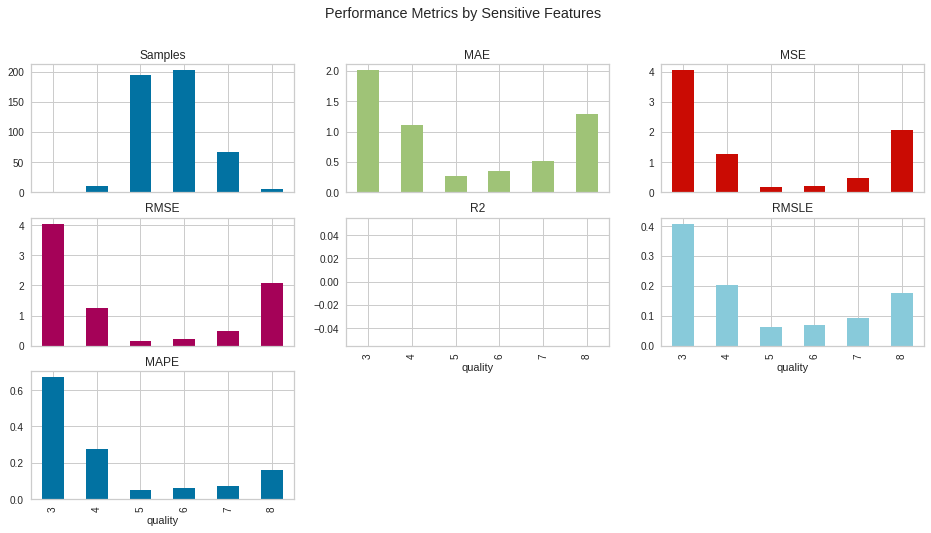

In [ ]:
# check fairness
check_fairness(et_model, sensitive_features= ['quality'])

The following are some common evaluation metrics used in regression models:

1. MAE (Mean Absolute Error): It measures the average magnitude of the errors in a set of predictions, without considering their direction. It is calculated by taking the absolute differences between the predicted values and the actual values and then averaging them.

2. MSE (Mean Squared Error): It measures the average of the squared differences between the predicted values and the actual values. It gives a higher weight to large errors than to small ones.

3. RMSE (Root Mean Squared Error): It is the square root of the MSE and gives an estimate of the standard deviation of the residuals. It is also in the same unit as the target variable, which makes it easier to interpret.

4. R2 (Coefficient of Determination): It measures how well the regression line fits the actual data. It ranges from 0 to 1, where 1 means a perfect fit.

5. RMSLE (Root Mean Squared Log Error): It is similar to RMSE but applies the logarithm function to the predicted and actual values first. This is useful when the target variable has a large range of values.

6. MAPE (Mean Absolute Percentage Error): It measures the average absolute percentage difference between the predicted values and the actual values. It is useful when the target variable has a wide range of values and you want to evaluate the performance of the model in terms of relative error.






# **5. Tune the Model**

To improve the performance of the model, the tune_model() function can be used to optimize the hyperparameters of the model.

In [ ]:
%%capture
!pip install scikit-optimize

In [ ]:
import numpy as np
from scipy.optimize import least_squares
from scipy.optimize import minimize
from scipy.optimize import fmin
import matplotlib.pyplot as plt

In [14]:
tuned_et_model=tune_model(et_model)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4861,0.3962,0.6294,0.3388,0.0965,0.0880
1,0.5230,0.5315,0.7290,0.4316,0.1181,0.1021
2,0.4754,0.3628,0.6024,0.4270,0.0930,0.0871
3,0.4550,0.3728,0.6105,0.4628,0.0959,0.0849
4,0.4809,0.3522,0.5935,0.3917,0.0872,0.0831
5,0.4780,0.3842,0.6198,0.4357,0.0909,0.0847
6,0.5090,0.4284,0.6546,0.4382,0.1019,0.0937
7,0.4990,0.4021,0.6341,0.3100,0.0986,0.0918
8,0.5514,0.5095,0.7138,0.2383,0.1133,0.1052


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 4
INFO:logs:ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse', max_depth=7,
                    max_features=1.0, max_leaf_nodes=None, max_samples=None,
                    min_impurity_decrease=0.0005, min_impurity_split=None,
                    min_samples_leaf=5, min_samples_split=5,
                    min_weight_fraction_leaf=0.0, n_estimators=120, n_jobs=-1,
                    oob_score=False, random_state=6162, verbose=0,
                    warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


# **6. Plot Model Performance**

The plot_model() function can be used to visualize the performance of the model on the training set.

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
import matplotlib.cbook as cbook
from matplotlib.cbook import mplDeprecation

## a. Validation Curve

Validation Curve - It is a plot that shows the performance of the model on the training and validation sets for different hyperparameter values.

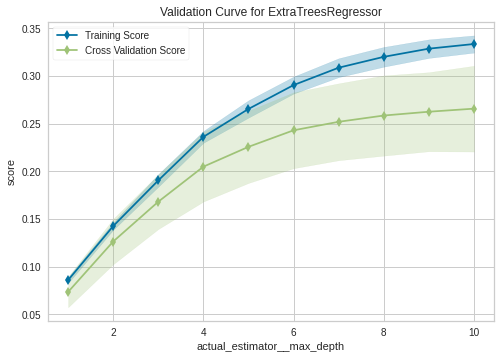

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_et_model, plot = 'vc')

## **b. Recursive Feature Selection**

Recursive Feature Selection - It is a technique to select the most important features for a model by recursively removing the least important features.

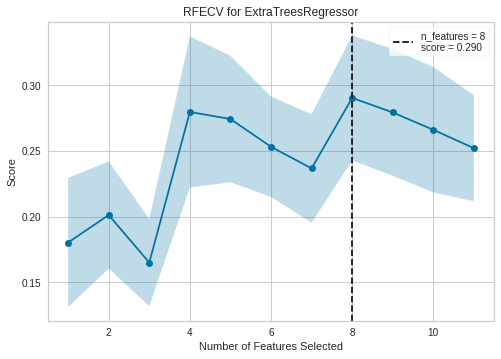

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_et_model, plot = 'rfe')

## **c. Feature Importance**

Feature Importance - It is a plot that shows the importance of each feature for a model.

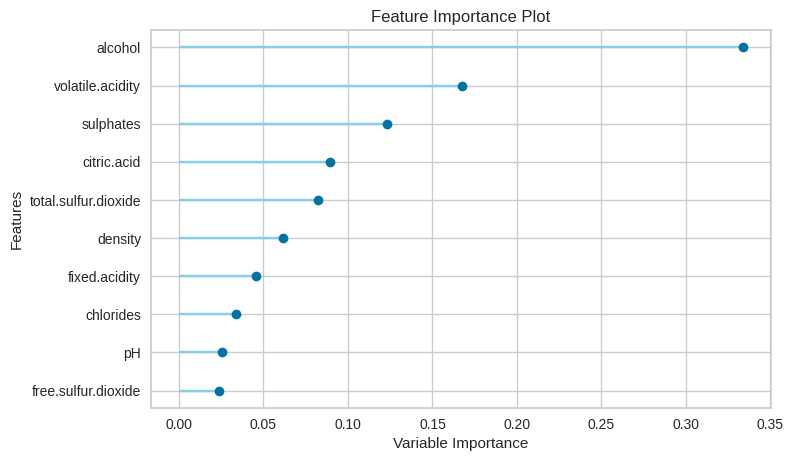

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_et_model, plot = 'feature')

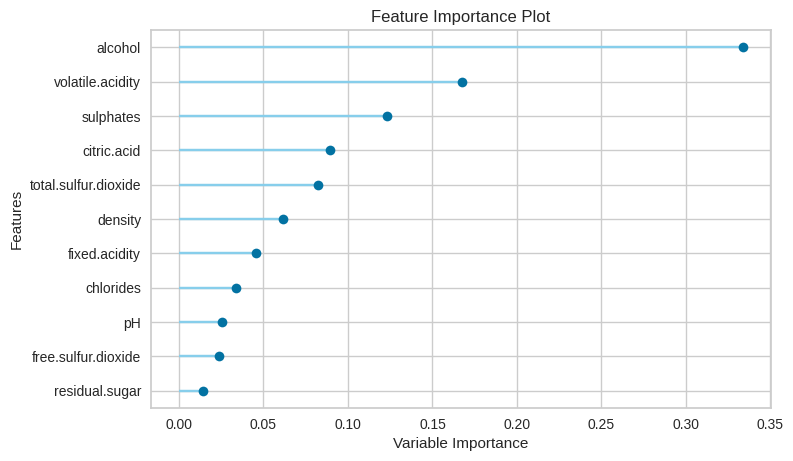

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_et_model, plot = 'feature_all')

## **d. Learning Curve**

Learning Curve - It is a plot that shows the performance of the model on the training and validation sets for different sample sizes.

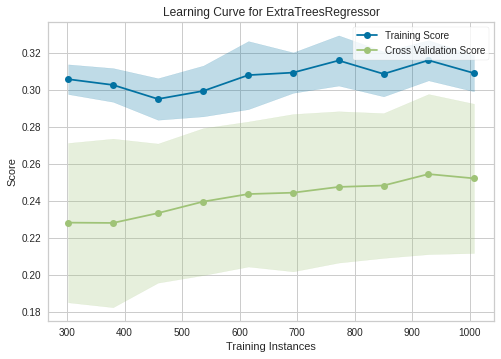

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_et_model, plot = 'learning')

## **e. Model Hyperparameter**

Model Hyperparameter - It is a plot that shows the performance of the model on the training and validation sets for different hyperparameter values.

In [ ]:
plot_model(tuned_et_model, plot = 'parameter')

,Parameters
bootstrap,True
ccp_alpha,0.0
criterion,mse
max_depth,7
max_features,log2
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.001
min_impurity_split,None
min_samples_leaf,3


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


We use `create_model()` to train an Extra Trees Classifier model on the dataset. Finally, we pass the trained model to `interpret_model()` to generate interpretation plots.

In [15]:
%%capture
!pip install shap

In [ ]:
%matplotlib

Using matplotlib backend: agg


In [16]:
et = create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.4097,0.3600,0.6000,0.3991,0.0923,0.0747
1,0.4221,0.4286,0.6547,0.5416,0.1066,0.0828
2,0.3837,0.3189,0.5647,0.4963,0.0886,0.0721
3,0.3835,0.3160,0.5621,0.5446,0.0880,0.0716
4,0.4103,0.3006,0.5482,0.4810,0.0805,0.0708
5,0.4300,0.3885,0.6233,0.4293,0.0911,0.0761
6,0.4212,0.3525,0.5937,0.5378,0.0929,0.0790
7,0.3626,0.3036,0.5510,0.4791,0.0856,0.0668
8,0.4536,0.4734,0.6880,0.2923,0.1117,0.0893


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 5
INFO:logs:ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=6162, verbose=0, warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [17]:
from pycaret.classification import *
from pycaret.regression import *

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=6162, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


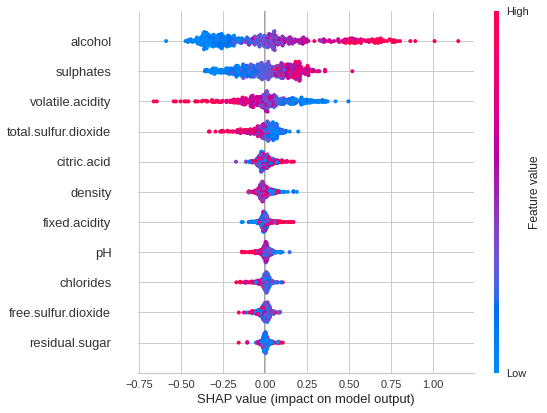

In [18]:
interpret_model(et)

The function interpret_model( ) only supports tree-based models for binary classification, specifically `et`, `rf`, `lightgbm`, and `dt`.

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse', max_depth=7,
                    max_features=1.0, max_leaf_nodes=None, max_samples=None,
                    min_impurity_decrease=0.0005, min_impurity_split=None,
                    min_samples_leaf=5, min_samples_split=5,
                    min_weight_fraction_leaf=0.0, n_estimators=120, n_jobs=-1,
                    oob_score=False, random_state=6162, verbose=0,
                    warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


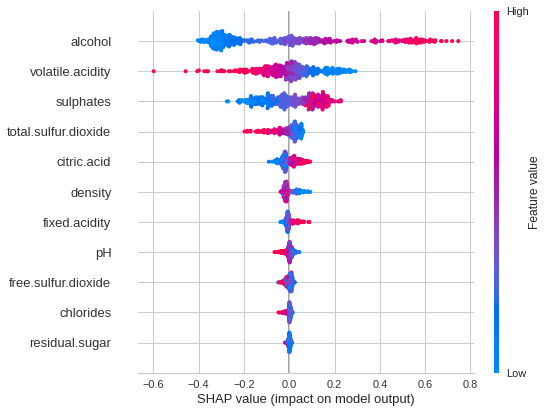

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [19]:
interpret_model(tuned_et_model)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse', max_depth=7,
                    max_features=1.0, max_leaf_nodes=None, max_samples=None,
                    min_impurity_decrease=0.0005, min_impurity_split=None,
                    min_samples_leaf=5, min_samples_split=5,
                    min_weight_fraction_leaf=0.0, n_estimators=120, n_jobs=-1,
                    oob_score=False, random_state=6162, verbose=0,
                    warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=correlation, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: correlation
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: type 2


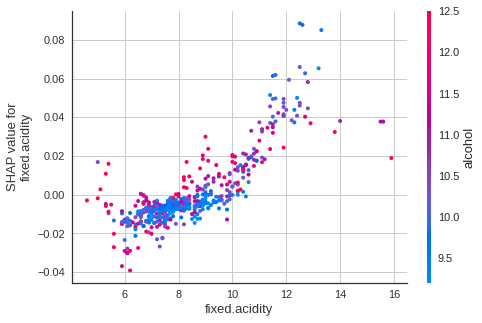

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [20]:
interpret_model(tuned_et_model,plot='correlation')

# **7. Evaluate Model**

The evaluate_model() function is used to evaluate the performance of the model on the test set.

In [21]:
evaluate_model(tuned_et_model)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse', max_depth=7,
                    max_features=1.0, max_leaf_nodes=None, max_samples=None,
                    min_impurity_decrease=0.0005, min_impurity_split=None,
                    min_samples_leaf=5, min_samples_split=5,
                    min_weight_fraction_leaf=0.0, n_estimators=120, n_jobs=-1,
                    oob_score=False, random_state=6162, verbose=0,
                    warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **8. Finalize Model**

After the model has been evaluated, the finalize_model() function can be used to finalize the model for deployment.

In [22]:
final_et = finalize_model(tuned_et_model)

INFO:logs:Initializing finalize_model()
INFO:logs:finalize_model(estimator=ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse', max_depth=7,
                    max_features=1.0, max_leaf_nodes=None, max_samples=None,
                    min_impurity_decrease=0.0005, min_impurity_split=None,
                    min_samples_leaf=5, min_samples_split=5,
                    min_weight_fraction_leaf=0.0, n_estimators=120, n_jobs=-1,
                    oob_score=False, random_state=6162, verbose=0,
                    warm_start=False), fit_kwargs=None, groups=None, model_only=True, display=None, experiment_custom_tags=None, return_train_score=False)
INFO:logs:Finalizing ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse', max_depth=7,
                    max_features=1.0, max_leaf_nodes=None, max_samples=None,
                    min_impurity_decrease=0.0005, min_impurity_split=None,
                    min_samples_leaf=5, min_samples_split=5,
               

In [23]:
final_et

ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse', max_depth=7,
                    max_features=1.0, max_leaf_nodes=None, max_samples=None,
                    min_impurity_decrease=0.0005, min_impurity_split=None,
                    min_samples_leaf=5, min_samples_split=5,
                    min_weight_fraction_leaf=0.0, n_estimators=120, n_jobs=-1,
                    oob_score=False, random_state=6162, verbose=0,
                    warm_start=False)

# **9. Predict Model**

Finally, the predict_model() function is used to make predictions on new data using the finalized model.

In [24]:
predict_model(tuned_et_model)

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse', max_depth=7,
                    max_features=1.0, max_leaf_nodes=None, max_samples=None,
                    min_impurity_decrease=0.0005, min_impurity_split=None,
                    min_samples_leaf=5, min_samples_split=5,
                    min_weight_fraction_leaf=0.0, n_estimators=120, n_jobs=-1,
                    oob_score=False, random_state=6162, verbose=0,
                    warm_start=False), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extra Trees Regressor,0.4928,0.3856,0.6209,0.3635,0.0956,0.0904


,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality,Label
0,6.8,0.570,0.00,2.5,0.072,32.0,64.0,0.99491,3.43,0.56,11.200000,6,5.771670
1,7.1,0.600,0.00,1.8,0.074,16.0,34.0,0.99720,3.47,0.70,9.900000,6,5.438670
2,7.5,0.755,0.00,1.9,0.084,6.0,12.0,0.99672,3.34,0.49,9.700000,4,4.989622
3,7.7,0.540,0.26,1.9,0.089,23.0,147.0,0.99636,3.26,0.59,9.700000,5,5.212483
4,7.3,0.670,0.02,2.2,0.072,31.0,92.0,0.99566,3.32,0.68,11.066667,6,5.721490
...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,8.1,1.330,0.00,1.8,0.082,3.0,12.0,0.99640,3.54,0.48,10.900000,5,4.629116
476,5.9,0.440,0.00,1.6,0.042,3.0,11.0,0.99440,3.48,0.85,11.700000,6,6.341091
477,6.6,0.700,0.08,2.6,0.106,14.0,27.0,0.99665,3.44,0.58,10.200000,5,5.531278
478,8.9,0.840,0.34,1.4,0.050,4.0,10.0,0.99554,3.12,0.48,9.100000,6,4.945137


# **10. Save Model**

In [25]:
save_model(tuned_et_model,'et_model')

INFO:logs:Initializing save_model()
INFO:logs:save_model(model=ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse', max_depth=7,
                    max_features=1.0, max_leaf_nodes=None, max_samples=None,
                    min_impurity_decrease=0.0005, min_impurity_split=None,
                    min_samples_leaf=5, min_samples_split=5,
                    min_weight_fraction_leaf=0.0, n_estimators=120, n_jobs=-1,
                    oob_score=False, random_state=6162, verbose=0,
                    warm_start=False), model_name=et_model, prep_pipe_=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=['Unnamed: 0'],
                                      ml_usecase='regression',
                                      numerical_features=[], target='quality',
                             

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=['Unnamed: 0'],
                                       ml_usecase='regression',
                                       numerical_features=[], target='quality',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numer...
                  ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0,
                                      criterion='mse', max_depth=7,
                                      max_features=1.0, max_leaf_nodes=None,
                                      max_samples=None,
   

In [26]:
!ls

et_model.pkl  logs.log	sample_data  wineQualityReds.csv


In [27]:
from pycaret.regression import load_model

In [28]:
load_et = load_model('et_model')

INFO:logs:Initializing load_model()
INFO:logs:load_model(model_name=et_model, platform=None, authentication=None, verbose=True)


Transformation Pipeline and Model Successfully Loaded


In [29]:
load_et

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=['Unnamed: 0'],
                                      ml_usecase='regression',
                                      numerical_features=[], target='quality',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numer...
                 ExtraTreesRegressor(bootstrap=True, ccp_alpha=0.0,
                                     criterion='mse', max_depth=7,
                                     max_features=1.0, max_leaf_nodes=None,
                                     max_samples=None,
                    